# CNN detections over entire season

In [1]:
from opensoundscape.audio import Audio
from opensoundscape.spectrogram import Spectrogram

import numpy as np
import pandas as pd
from glob import glob
from pathlib import Path

from opensoundscape.audio import Audio
from opensoundscape.spectrogram import Spectrogram

import numpy as np
import pandas as pd
from glob import glob
from pathlib import Path

from matplotlib import pyplot as plt
plt.rcParams['figure.figsize']=[15,5] #for big visuals
%config InlineBackend.figure_format = 'retina'



/home/sml161/miniconda3/envs/opso_dev/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# plotting settings

In [2]:
from matplotlib import pyplot as plt
small_txt = 7
med_txt = 8
big_txt = 8
# set text sizes
plt.rcParams['font.size'] = small_txt
plt.rcParams['axes.labelsize'] = med_txt
plt.rcParams['axes.titlesize'] = big_txt
plt.rcParams['xtick.labelsize'] = small_txt
plt.rcParams['ytick.labelsize'] = small_txt
plt.rcParams['legend.fontsize'] = med_txt
plt.rcParams['figure.titlesize'] = big_txt
# opaque legend (<1 is not fully opaque)
plt.rcParams["legend.framealpha"] = 1.0
# set figure size
plt.rcParams['figure.figsize']=[6,2.5]
plt.rcParams['figure.dpi'] = 300
# set default font
# plt.rcParams['font.sans-serif'] = "Gill Sans"
# plt.rcParams['font.family'] = "sans-serif"
plt.rcParams['font.sans-serif'] = "gillsans"

# TIP use these 2 lines to list all available fonts:
# from matplotlib import font_manager
# font_manager.findSystemFonts(fontpaths=None, fontext="ttf")

# to add a font
# on linux, add .ttf font files to /usr/share/fonts/truetype/
# then follow these instructions https://scentellegher.github.io/visualization/2018/05/02/custom-fonts-matplotlib.html 

# tell matplotlib to create vector fonts (so you can edit them later, eg in Illustrator)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

#color and line style cycles #
# TIP: use https://coolers.co to create nice color palettes
#or modify this one https://coolors.co/35aad8-f3b61f-ba3b54-45b69c-8a96d7
from cycler import cycler
default_cycler = (cycler(color=['#35aad8','#f3b61f','#8a96d7','#45b69c','#ba3b54']) +
                  cycler(linestyle=['-', '--', '-.', ':','-']))

# plt.rc('lines', linewidth=0.5)
plt.rc('axes', prop_cycle=default_cycler)

#use appropriate resolution for retina screens
%config InlineBackend.figure_format='retina'


# Other useful plot manipulations:
# ax = plt.gca() #get axis from current plot

#reformat x ticks to date or time (values should be datetime.datetime)
# ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%d'))

# reduce the number of ticks/labels on an axis
# ax.xaxis.set_major_locator(plt.MaxNLocator(8))

In [3]:
scores = pd.concat([pd.read_csv(f) for f in glob('/media/emu/projects/sml161/ecco12_ramu/cnn_preds/sine2022a/*.csv')])

In [4]:
from scipy.special import softmax, logit

In [5]:
scores.head()

,file,start_time,end_time,ramu,negative
0,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,0.0,2.0,-2.809221,1.639653
1,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,2.0,4.0,-3.063788,2.189772
2,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,4.0,6.0,-3.129897,2.139067
3,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,6.0,8.0,-2.968894,2.549560
4,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,8.0,10.0,-2.530122,1.648317


/home/sml161/miniconda3/envs/opso_dev/lib/python3.9/site-packages/matplotlib_inline/config.py:68: DeprecationWarning: InlineBackend._figure_format_changed is deprecated in traitlets 4.1: use @observe and @unobserve instead.
  def _figure_format_changed(self, name, old, new):


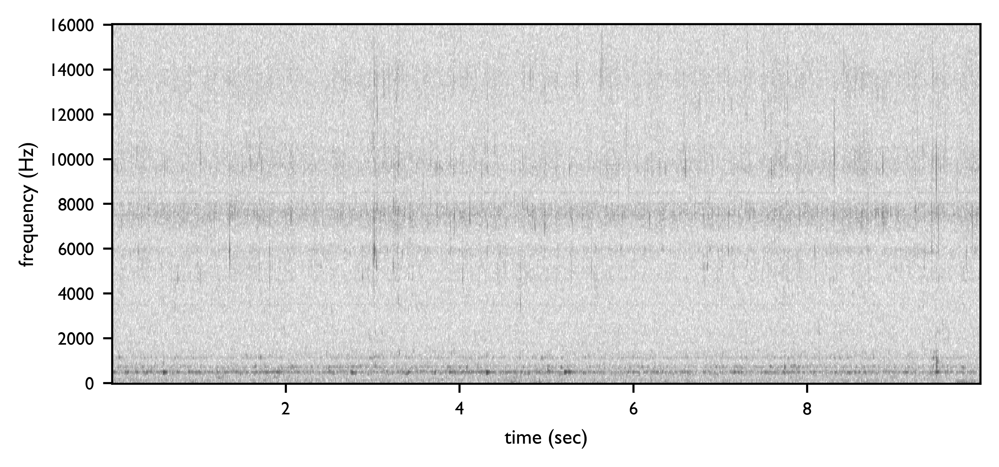

In [6]:
a=Audio.from_file(scores.file.values[0],duration=10)
Spectrogram.from_audio(a).plot()

In [7]:
from IPython.display import Audio as IPyAudio
IPyAudio(filename=scores.file.values[0])

# results on one card

In [8]:
scores['sm']=softmax(scores[['ramu','negative']],axis=1)[:,0]

In [9]:
scores['lg']=logit(scores['sm'])
scores.head()

,file,start_time,end_time,ramu,negative,sm,lg
0,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,0.0,2.0,-2.809221,1.639653,0.011557,-4.448873
1,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,2.0,4.0,-3.063788,2.189772,0.005202,-5.253560
2,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,4.0,6.0,-3.129897,2.139067,0.005123,-5.268964
3,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,6.0,8.0,-2.968894,2.549560,0.003996,-5.518453
4,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,8.0,10.0,-2.530122,1.648317,0.015091,-4.178439


(array([1.10000e+01, 1.70000e+01, 1.50000e+01, 6.80000e+01, 3.08000e+02,
        2.71700e+03, 3.75240e+04, 1.96715e+05, 2.35931e+05, 1.12653e+05,
        5.10620e+04, 2.60770e+04, 1.45130e+04, 8.95300e+03, 5.74600e+03,
        3.95700e+03, 2.98200e+03, 2.34300e+03, 2.04800e+03, 1.85700e+03,
        1.73900e+03, 1.63400e+03, 1.61900e+03, 1.59300e+03, 1.45800e+03,
        1.21700e+03, 9.28000e+02, 6.45000e+02, 4.83000e+02, 3.43000e+02,
        2.44000e+02, 1.92000e+02, 1.23000e+02, 8.70000e+01, 4.50000e+01,
        3.70000e+01, 1.50000e+01, 1.60000e+01, 7.00000e+00, 2.00000e+00]),
 array([-11.3598703 , -10.55346897,  -9.74706764,  -8.94066631,
         -8.13426497,  -7.32786364,  -6.52146231,  -5.71506098,
         -4.90865965,  -4.10225832,  -3.29585698,  -2.48945565,
         -1.68305432,  -0.87665299,  -0.07025166,   0.73614967,
          1.542551  ,   2.34895234,   3.15535367,   3.961755  ,
          4.76815633,   5.57455766,   6.38095899,   7.18736033,
          7.99376166,   8.8001

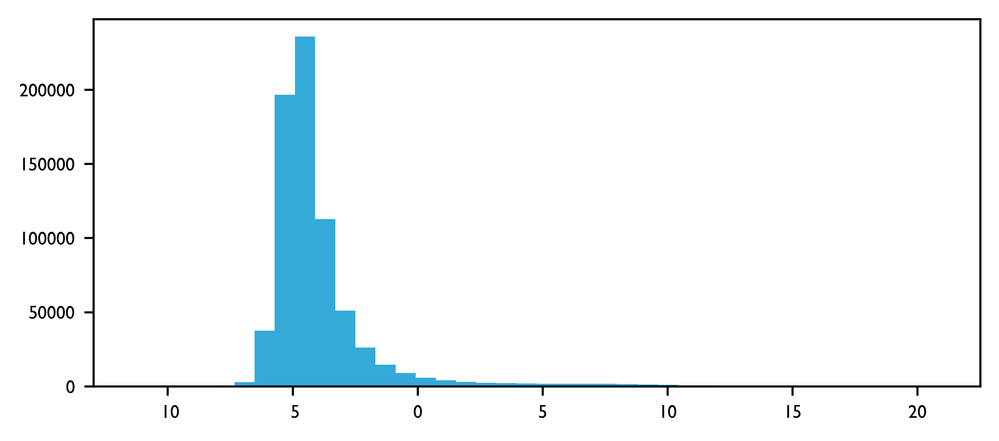

In [10]:
plt.hist(scores.lg,bins=40)

In [11]:
from opensoundscape.audio import Audio
from opensoundscape.spectrogram import Spectrogram

import numpy as np
import pandas as pd
from glob import glob
from pathlib import Path

from matplotlib import pyplot as plt
plt.rcParams['figure.figsize']=[15,5] #for big visuals
%config InlineBackend.figure_format = 'retina'



In [12]:
thresholds = [2,4,6,7.313,8,10]

In [13]:
from opensoundscape.audiomoth import audiomoth_start_time

In [14]:
import pytz
tz = pytz.timezone('US/Pacific')

In [15]:
scores['date']=[audiomoth_start_time(f).astimezone(tz).date() for f in scores.file]
scores['time']=[audiomoth_start_time(f).astimezone(tz).replace(second=0, microsecond=0).time() for f in scores.file]
scores['dt']=[audiomoth_start_time(f).astimezone(tz) for f in scores.file]


In [16]:
for th in thresholds:
    scores[f"t_{th}"] = scores.lg>th

In [17]:
dates = np.sort(scores.date.unique())
times = np.sort(scores.time.unique())

In [18]:
# import matplotlib as mpl
# mpl.font_manager.

In [19]:
scores.columns

Index(['file', 'start_time', 'end_time', 'ramu', 'negative', 'sm', 'lg',
       'date', 'time', 'dt', 't_2', 't_4', 't_6', 't_7.313', 't_8', 't_10'],
      dtype='object')

In [20]:
scores

,file,start_time,end_time,ramu,negative,sm,lg,date,time,dt,t_2,t_4,t_6,t_7.313,t_8,t_10
0,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,0.0,2.0,-2.809221,1.639653,0.011557,-4.448873,2022-06-12,18:00:00,2022-06-12 18:00:00-07:00,False,False,False,False,False,False
1,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,2.0,4.0,-3.063788,2.189772,0.005202,-5.253560,2022-06-12,18:00:00,2022-06-12 18:00:00-07:00,False,False,False,False,False,False
2,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,4.0,6.0,-3.129897,2.139067,0.005123,-5.268964,2022-06-12,18:00:00,2022-06-12 18:00:00-07:00,False,False,False,False,False,False
3,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,6.0,8.0,-2.968894,2.549560,0.003996,-5.518453,2022-06-12,18:00:00,2022-06-12 18:00:00-07:00,False,False,False,False,False,False
4,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,8.0,10.0,-2.530122,1.648317,0.015091,-4.178439,2022-06-12,18:00:00,2022-06-12 18:00:00-07:00,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143695,/media/emu/datasets/aru/sine2022a/MSD-0904/202...,50.0,52.0,-2.466007,2.123168,0.010059,-4.589175,2022-07-01,07:00:00,2022-07-01 07:00:00-07:00,False,False,False,False,False,False
143696,/media/emu/datasets/aru/sine2022a/MSD-0904/202...,52.0,54.0,-2.368481,2.249125,0.009780,-4.617606,2022-07-01,07:00:00,2022-07-01 07:00:00-07:00,False,False,False,False,False,False
143697,/media/emu/datasets/aru/sine2022a/MSD-0904/202...,54.0,56.0,-2.832348,2.378833,0.005426,-5.211181,2022-07-01,07:00:00,2022-07-01 07:00:00-07:00,False,False,False,False,False,False
143698,/media/emu/datasets/aru/sine2022a/MSD-0904/202...,56.0,58.0,-2.476065,2.208164,0.009155,-4.684229,2022-07-01,07:00:00,2022-07-01 07:00:00-07:00,False,False,False,False,False,False


In [21]:
scores.columns

Index(['file', 'start_time', 'end_time', 'ramu', 'negative', 'sm', 'lg',
       'date', 'time', 'dt', 't_2', 't_4', 't_6', 't_7.313', 't_8', 't_10'],
      dtype='object')

/tmp/ipykernel_983335/1810932904.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  date_avg = scores.groupby('date').mean()
'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
too much 'glyf' table data: expected 42820, received 42914 bytes
too much 'hmtx' table data


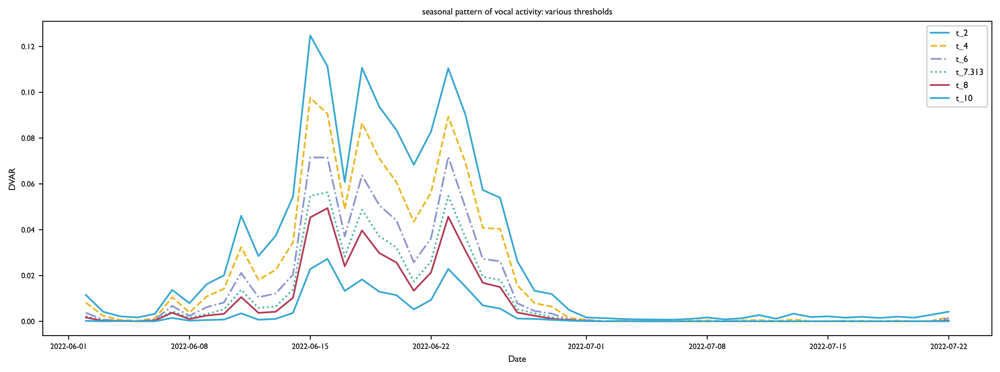

In [22]:
date_avg = scores.groupby('date').mean()
for col in scores.columns[10:]:
    plt.plot(dates,date_avg[col],label=col,linewidth=1.5)
    # plt.scatter(dates,date_avg[col],s=3)
plt.legend()
plt.title('seasonal pattern of vocal activity: various thresholds')
plt.xlabel('Date')
plt.ylabel('DVAR')
plt.savefig('./figures/seasonal_dvar_thresholds.pdf')

In [45]:
len(scores.file.unique())

23931

In [23]:
from torch import logit, sigmoid, tensor
sigmoid(tensor([2,4,6,8,10]))

tensor([0.8808, 0.9820, 0.9975, 0.9997, 1.0000])

logit score threshold for chosen threshold (99% precision)

In [24]:
logit(tensor(0.999334))

tensor(7.3135)

In [25]:
# time_avg = scores.groupby('time').mean()
# for col in scores.columns[9:]:
#     plt.plot([str(t) for t in times],time_avg[col],label=col)
# _=plt.xticks(rotation=90)
# plt.title('Daily patterns in DVAR: multiple thresholds')
# plt.legend()

# all cards

In [26]:
scores = pd.concat([pd.read_csv(f) for f in glob('/media/emu/projects/sml161/ecco12_ramu/cnn_preds/sine2022a/*.csv')])

In [27]:
from scipy.special import softmax, logit

In [28]:
scores['sm']=softmax(scores[['ramu','negative']],axis=1)[:,0]

In [29]:
scores['lg']=logit(scores['sm'])
scores.head()

,file,start_time,end_time,ramu,negative,sm,lg
0,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,0.0,2.0,-2.809221,1.639653,0.011557,-4.448873
1,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,2.0,4.0,-3.063788,2.189772,0.005202,-5.253560
2,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,4.0,6.0,-3.129897,2.139067,0.005123,-5.268964
3,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,6.0,8.0,-2.968894,2.549560,0.003996,-5.518453
4,/media/emu/datasets/aru/sine2022a/MSD-1545/202...,8.0,10.0,-2.530122,1.648317,0.015091,-4.178439


In [30]:
# plt.hist(scores.lg,bins=30)

In [31]:
thresholds = [2,4,6,8,7.3135,10]
threshold_columns = [f"t_{th}" for th in thresholds]

In [32]:
from opensoundscape.audiomoth import audiomoth_start_time

In [33]:
from opensoundscape.audiomoth import audiomoth_start_time
import pytz
tz = pytz.timezone('US/Pacific')
scores['date']=[audiomoth_start_time(f).astimezone(tz).date() for f in scores.file]
scores['time']=[audiomoth_start_time(f).astimezone(tz).time() for f in scores.file]


In [34]:
for th in thresholds:
    scores[f"t_{th}"] = scores.lg>th

In [35]:
# dates = np.sort(scores.date.unique())
# times = np.sort(scores.time.unique())

/tmp/ipykernel_983335/2247163703.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  date_total = scores.groupby('date').sum()
'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
too much 'glyf' table data: expected 42820, received 42914 bytes
too much 'hmtx' table data


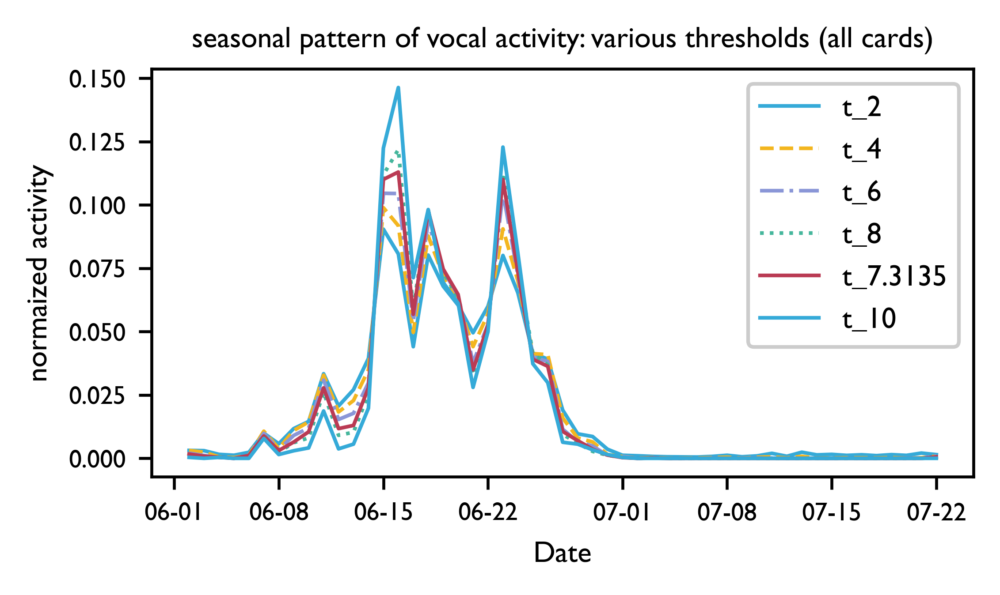

In [37]:
import matplotlib
plt.figure(figsize=(4,2)) 

date_total = scores.groupby('date').sum()
for col in threshold_columns:
    norm = date_total[col]/scores[col].sum()
    plt.plot(dates,norm,label=col,linewidth=1)
    # plt.scatter(dates,norm,
plt.legend()
plt.ylabel('normaized activity')
plt.title('seasonal pattern of vocal activity: various thresholds (all cards)')
plt.xlabel('Date')

#reformat x ticks to date
ax = plt.gca()
ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%d'))
# ax.xaxis.set_major_locator(plt.MaxNLocator(8))


plt.savefig('./figures/seasonal_activity_normalized_thresholds.pdf')


In [38]:
scores['card']=[f.split('/')[-2] for f in scores.file]

'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
too much 'glyf' table data: expected 42820, received 42914 bytes
too much 'hmtx' table data


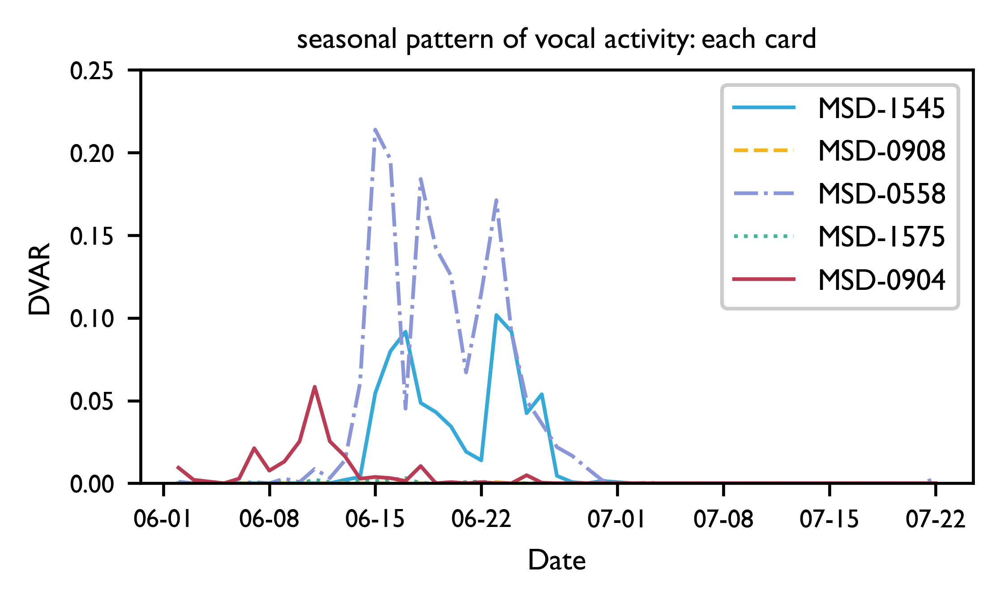

In [39]:
plt.figure(figsize=(4,2)) 

import warnings
warnings.filterwarnings('ignore')
for card in scores.card.unique():
    scores_card = scores[scores.card==card]
    date_total = scores_card.groupby('date').mean()
    col = ['t_7.3135'] #pick 1 threshold
    norm = date_total[col]#/scores_card[col].sum()
    plt.plot(dates,norm,label=card,linewidth=1)
    plt.legend()
    plt.title('seasonal pattern of vocal activity: each card')
plt.ylabel('DVAR')
plt.xlabel('Date')

plt.ylim([0,.25])

#reformat x ticks to date
ax = plt.gca()
ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%d'))
plt.savefig('./figures/dvar_by_card.pdf')


# Daily Pattern

'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
too much 'glyf' table data: expected 42820, received 42914 bytes
too much 'hmtx' table data


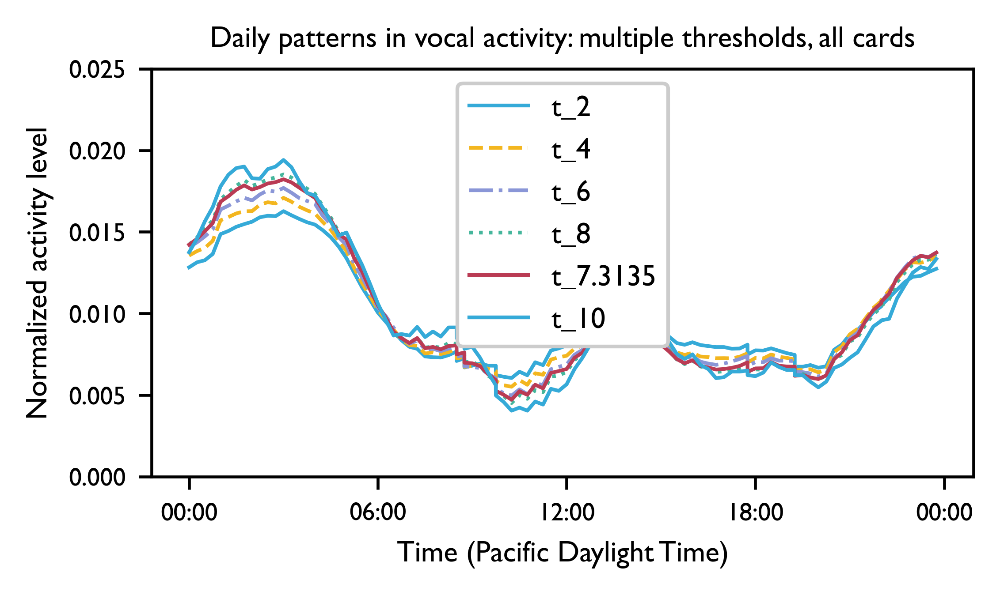

In [42]:
from datetime import datetime
plt.figure(figsize=(4,2)) 

rolling_avg_size = 12
time_total = scores.groupby('time').sum()
time_total_rolling = time_total.tail(rolling_avg_size-1).append(time_total) #wrap arround for moving avg
dt = [datetime.combine(datetime.today(),t) for t in time_total_rolling.index]

for col in threshold_columns:
    
    norm = time_total_rolling[col].rolling(rolling_avg_size).mean()/scores[col].sum()
    plt.plot(dt,norm,label=col,linewidth=1)

    
    # norm = time_total_rolling[col].rolling(8).mean()/scores[col].sum()
time_mean = scores.groupby('time').mean()
# time_mean_rolling = time_mean.tail(rolling_avg_size-1).append(time_mean) #wrap arround for moving avg

plt.title('Daily patterns in vocal activity: multiple thresholds, all cards')


# PLOTTING SETTINGS
ax = plt.gca()
#reformat x ticks to time
ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%H:%M'))
# use less axis labels
ax.xaxis.set_major_locator(plt.MaxNLocator(5))
ax.legend()
ax.set_xlabel('Time (Pacific Daylight Time)')
ax.set_ylabel('Normalized activity level')
ax.set_ylim(0,0.025)

# ax[1].set_ylabel('average temperature (C)')

plt.savefig('./figures/time_with_3hr_rolling_avg_thresholds.pdf')

'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
too much 'glyf' table data: expected 42820, received 42914 bytes
too much 'hmtx' table data


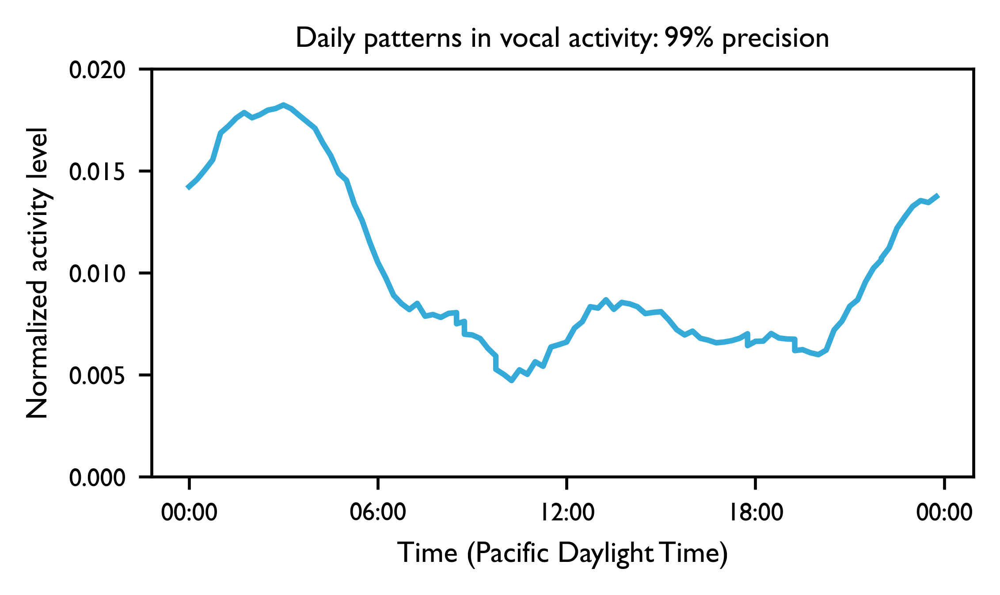

In [43]:
plt.figure(figsize=(4,2)) 

rolling_avg_size = 12
time_total = scores.groupby('time').sum()
time_total_rolling = time_total.tail(rolling_avg_size-1).append(time_total) #wrap arround for moving avg
dt = [datetime.combine(datetime.today(),t) for t in time_total_rolling.index]

for col in ['t_7.3135']:
    
    norm = time_total_rolling[col].rolling(rolling_avg_size).mean()/scores[col].sum()
    plt.plot(dt,norm,linewidth=1.5)

    
    # norm = time_total_rolling[col].rolling(8).mean()/scores[col].sum()
time_mean = scores.groupby('time').mean()
# time_mean_rolling = time_mean.tail(rolling_avg_size-1).append(time_mean) #wrap arround for moving avg

# dt = [datetime.combine(datetime.today(),t) for t in time_mean.index]
# ax[1].plot(dt,time_mean['temp'],label=col)
    
plt.title('Daily patterns in vocal activity: 99% precision')

# PLOTTING SETTINGS
ax = plt.gca()
#reformat x ticks to time
ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%H:%M'))
# use less axis labels
ax.xaxis.set_major_locator(plt.MaxNLocator(5))
# ax.legend()
ax.set_xlabel('Time (Pacific Daylight Time)')
ax.set_ylabel('Normalized activity level')
ax.set_ylim(0,0.025)

ax.set_ylim(0,0.02)

# ax[1].set_ylabel('average temperature (C)')

plt.savefig('./figures/time_with_3hr_rolling_avg.pdf')

# Compare to Temperature

this was slow, just reload `sine2022a_ramu_scores_with_temp.csv` in the future

In [44]:
# scores['temp']=np.nan
# from tqdm import tqdm
# from tinytag import TinyTag
# for f in tqdm(scores.file.unique()):
#     water_temp=Audio.from_file(f,duration=0.001).metadata['temperature_C']
#     scores.loc[scores.file==f,'temp']=water_temp
# scores.to_csv('sine2022a_ramu_scores_with_temp.csv')

In [45]:
scores = pd.read_csv('sine2022a_ramu_scores_with_temp.csv')

Text(0, 0.5, 'DVAR during recording')

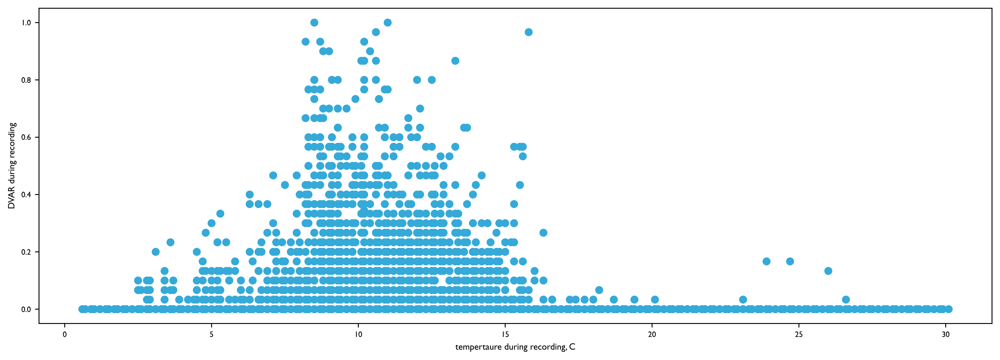

In [46]:
file_scores = scores.groupby('file').mean()
plt.scatter(file_scores['temp'],file_scores['t_6'])
plt.xlabel('tempertaure during recording, C')
plt.ylabel('DVAR during recording')

Text(0, 0.5, 'DVAR')

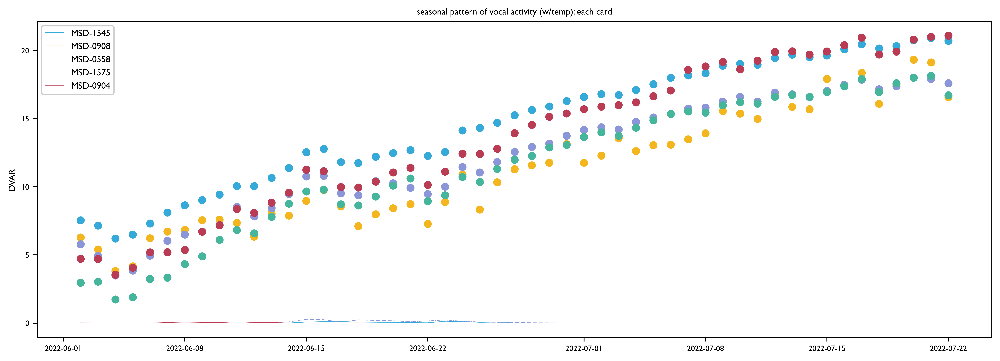

In [47]:
for card in scores.card.unique():
    scores_card = scores[scores.card==card]
    date_total = scores_card.groupby('date').mean()
    col = ['t_6'] #pick 1 threshold
    norm = date_total[col]#/scores_card[col].sum()
    plt.plot(dates,norm,label=card)
    plt.scatter(dates,date_total['temp'])
    plt.legend()
    plt.title('seasonal pattern of vocal activity (w/temp): each card')
plt.ylabel('DVAR')

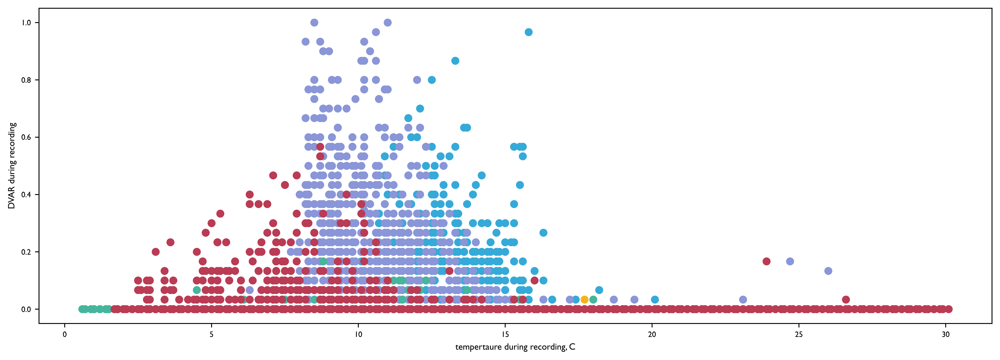

In [48]:
warnings.filterwarnings('ignore')
for card in scores.card.unique():
    scores_card = scores[scores.card==card]
    file_scores = scores_card.groupby('file').mean()
    plt.scatter(file_scores['temp'],file_scores['t_6'])
    plt.xlabel('tempertaure during recording, C')
    plt.ylabel('DVAR during recording')

## plot time and temperature

In [49]:
import matplotlib
from datetime import datetime

In [56]:
scores['time']=[datetime.strptime(s,'%H:%M:%S').time() for s in scores.time]

'created' timestamp seems very low; regarding as unix timestamp
'modified' timestamp seems very low; regarding as unix timestamp
too much 'glyf' table data: expected 42820, received 42914 bytes
too much 'hmtx' table data


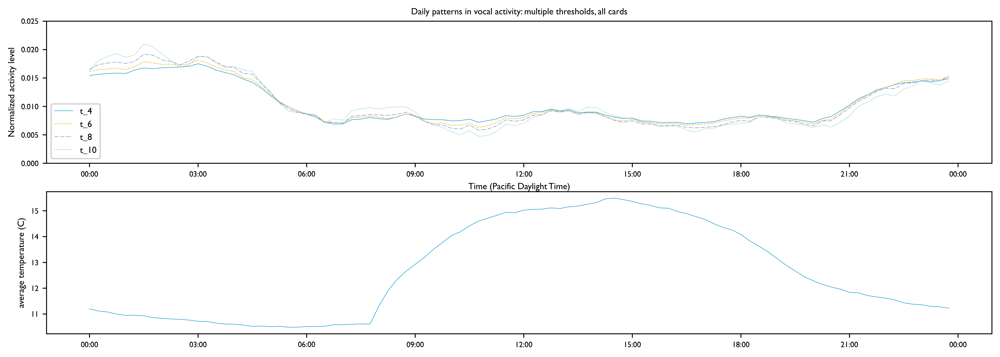

In [59]:
rolling_avg_size = 8
time_total = scores.groupby('time').sum()
time_total_rolling = time_total.tail(rolling_avg_size-1).append(time_total) #wrap arround for moving avg
dt = [datetime.combine(datetime.today(),t) for t in time_total_rolling.index]

fig, ax = plt.subplots(2)
for col in scores.columns[10:-3]:
    
    norm = time_total_rolling[col].rolling(rolling_avg_size).mean()/scores[col].sum()
    ax[0].plot(dt,norm,label=col)


    
    # norm = time_total_rolling[col].rolling(8).mean()/scores[col].sum()
time_mean = scores.groupby('time').mean()
# time_mean_rolling = time_mean.tail(rolling_avg_size-1).append(time_mean) #wrap arround for moving avg

dt = [datetime.combine(datetime.today(),t) for t in time_mean.index]
ax[1].plot(dt,time_mean['temp'],label=col)
    
ax[0].set_title('Daily patterns in vocal activity: multiple thresholds, all cards')

#reformat x ticks to time
ax[0].xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%H:%M'))
ax[1].xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%H:%M'))

ax[0].legend()
ax[0].set_xlabel('Time (Pacific Daylight Time)')
ax[0].set_ylabel('Normalized activity level')

ax[0].set_ylim(0,0.025)

ax[1].set_ylabel('average temperature (C)')

plt.savefig('./figures/time_with_2hr_rolling_avg.pdf')

In [64]:
# scores[['file','start_time','end_time','lg','card','temp','dt','date','time']].to_csv('score_summary_table.csv',index=False)

In [78]:
simple = scores.copy()
simple['det']=(simple['sm']>0.99933).astype(int)
simple=simple[['file','det','card','temp','dt','date','time']]
summary = simple.groupby(['time','date']).mean()#.to_csv('./mean_detection_rate_and_temp_across_time_of_day')
summary.to_csv('./mean_detection_rate_and_temp_across_time_of_day.csv')

In [65]:
time_mean = scores.groupby('time').mean()
time_mean[['']]

,start_time,end_time,ramu,negative,sm,lg,t_2,t_4,t_6,t_8,t_10,temp
time,,,,,,,,,,,,
00:00:00,29.0,31.0,-2.241469,1.676595,0.072215,-3.918064,0.038667,0.028933,0.023600,0.016533,0.008000,11.1968
00:15:00,29.0,31.0,-2.216305,1.648574,0.078237,-3.864879,0.043467,0.032133,0.023600,0.014800,0.008267,11.1156
00:30:00,29.0,31.0,-2.248650,1.692885,0.070942,-3.941535,0.040400,0.031867,0.024000,0.016000,0.009333,11.0776
00:45:00,29.0,31.0,-2.261489,1.709846,0.071768,-3.971335,0.039467,0.029333,0.020267,0.012000,0.006533,10.9944
01:00:00,29.0,31.0,-2.259070,1.706216,0.072023,-3.965286,0.040400,0.030133,0.020533,0.013067,0.005600,10.9452
...,...,...,...,...,...,...,...,...,...,...,...,...
22:45:00,29.0,31.0,-2.274017,1.720049,0.070604,-3.994066,0.036800,0.028000,0.018933,0.010800,0.005200,11.3804
23:00:00,29.0,31.0,-2.266819,1.716469,0.070392,-3.983288,0.039600,0.031200,0.023333,0.014667,0.007467,11.3560
23:15:00,29.0,31.0,-2.274267,1.716678,0.068157,-3.990945,0.033867,0.024133,0.018267,0.011467,0.005067,11.2932


## sunrise and sunset times are around 5:30am-6:15pm in June